In [0]:
%pip install kaleido
%pip install openpyxl
%pip install plotly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/66.3 kB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.3/66.3 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/52.3 kB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.3/52.3 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/365.8 kB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.8/365.8 kB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/152.4 kB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.4/152.4 kB 10.5 MB/s eta 0:00:00
  Attempting uninstall: simplejson
    Found existing installation: simplejson 3.17.6
    Not uninstalling simplejson at /databricks/python3/lib/python3.12/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-0f44f13f-f1ba-44fe-8116-eea1d4205f7b
    Can't uninstall 'simplejson'. No files were found to uninstall.
  Attempting uninstall: pluggy
    Found existing installatio

In [0]:
%pip install plotly


Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
# Data manipulation and analysis
import pandas as pd
import numpy as np
from pyspark.sql import SparkSession
from pyspark.sql.functions import *
from pyspark.sql.types import *
# Utilities
import warnings
warnings.filterwarnings('ignore')

# Machine learning
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fba3ea462a0>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'


In [0]:
df = pd.read_csv('/dbfs/FileStore/shared_uploads/sm25346@cardiffmet.ac.uk/SCFP2022.csv')

In [0]:
print(f"Dataset shape: {df.shape}")
print(f"Columns: {df.columns.tolist()}")

# Display basic information
df.info()
df.head()

Dataset shape: (22975, 357)
Columns: ['YY1', 'Y1', 'WGT', 'HHSEX', 'AGE', 'AGECL', 'EDUC', 'EDCL', 'MARRIED', 'KIDS', 'LF', 'LIFECL', 'FAMSTRUCT', 'RACECL', 'RACECL4', 'RACECL5', 'RACECL_EX', 'RACE', 'OCCAT1', 'OCCAT2', 'INDCAT', 'FOODHOME', 'FOODAWAY', 'FOODDELV', 'RENT', 'INCOME', 'WAGEINC', 'BUSSEFARMINC', 'INTDIVINC', 'KGINC', 'SSRETINC', 'TRANSFOTHINC', 'PENACCTWD', 'NORMINC', 'WSAVED', 'SAVED', 'SAVRES1', 'SAVRES2', 'SAVRES3', 'SAVRES4', 'SAVRES5', 'SAVRES6', 'SAVRES7', 'SAVRES8', 'SAVRES9', 'SPENDMOR', 'SPENDLESS', 'EXPENSHILO', 'LATE', 'LATE60', 'HPAYDAY', 'BNKRUPLAST5', 'KNOWL', 'YESFINRISK', 'NOFINRISK', 'CRDAPP', 'TURNDOWN', 'FEARDENIAL', 'TURNFEAR', 'FORECLLAST5', 'EMERGBORR', 'EMERGSAV', 'EMERGPSTP', 'EMERGCUT', 'EMERGWORK', 'HBORRFF', 'HBORRCC', 'HBORRALT', 'HBORRFIN', 'HSAVFIN', 'HSAVNFIN', 'HPSTPPAY', 'HPSTPLN', 'HPSTPOTH', 'HCUTFOOD', 'HCUTENT', 'HCUTOTH', 'FINLIT', 'BSHOPNONE', 'BSHOPGRDL', 'BSHOPMODR', 'ISHOPNONE', 'ISHOPGRDL', 'ISHOPMODR', 'BCALL', 'BMAGZNEWS', 'BMA

,YY1,Y1,WGT,HHSEX,AGE,AGECL,EDUC,EDCL,MARRIED,KIDS,LF,LIFECL,FAMSTRUCT,RACECL,RACECL4,RACECL5,RACECL_EX,RACE,OCCAT1,OCCAT2,INDCAT,FOODHOME,FOODAWAY,FOODDELV,RENT,INCOME,WAGEINC,BUSSEFARMINC,INTDIVINC,KGINC,SSRETINC,TRANSFOTHINC,PENACCTWD,NORMINC,WSAVED,SAVED,SAVRES1,SAVRES2,SAVRES3,SAVRES4,...,PAYPEN6,TPAY,MORTPAY,CONSPAY,REVPAY,PIRTOTAL,PIRMORT,PIRCONS,PIRREV,PIR40,PLOAN1,PLOAN2,PLOAN3,PLOAN4,PLOAN5,PLOAN6,PLOAN7,PLOAN8,LLOAN1,LLOAN2,LLOAN3,LLOAN4,LLOAN5,LLOAN6,LLOAN7,LLOAN8,LLOAN9,LLOAN10,LLOAN11,LLOAN12,NWCAT,INCCAT,ASSETCAT,NINCCAT,NINC2CAT,NWPCTLECAT,INCPCTLECAT,NINCPCTLECAT,INCQRTCAT,NINCQRTCAT
0,1,11,3027.956120,2,70,5,9,3,2,2,0,6,1,1,1,1,99,1,3,4,4,600,0,840,0.0,38804.734469,0.0,0.0,54.045591,0.0,38804.734469,0.0,6377.379759,38804.734469,3,1,0,0,0,0,...,0,1600.0,1600.0,0.0,0.0,0.494785,0.494785,0.0,0.0,1,195000,0,0,0,0,0,0,0,195000,0,0,0,0,0,0,0,0,0,0,0,4,2,4,2,1,8,3,3,2,1
1,1,12,3054.900065,2,70,5,9,3,2,2,0,6,1,1,1,1,99,1,3,4,4,600,0,960,0.0,38264.278557,0.0,0.0,54.045591,0.0,37183.366733,0.0,4756.012024,38264.278557,3,1,0,0,0,0,...,0,3700.0,3700.0,0.0,0.0,1.160351,1.160351,0.0,0.0,1,213000,0,0,0,0,0,0,0,213000,0,0,0,0,0,0,0,0,0,0,0,4,2,5,2,1,8,3,3,2,1
2,1,13,3163.637766,2,70,5,9,3,2,2,0,6,1,1,1,1,99,1,3,4,4,600,0,840,0.0,36102.454910,0.0,0.0,54.045591,0.0,35021.543086,0.0,2594.188377,36102.454910,3,1,0,0,0,0,...,0,1800.0,1800.0,0.0,0.0,0.598297,0.598297,0.0,0.0,1,279000,0,0,0,0,0,0,0,279000,0,0,0,0,0,0,0,0,0,0,0,4,2,4,2,1,8,3,3,1,1
3,1,14,3166.228463,2,70,5,9,3,2,2,0,6,1,1,1,1,99,1,3,4,4,600,0,840,0.0,33508.266533,0.0,0.0,54.045591,0.0,32427.354709,0.0,0.000000,33508.266533,3,1,0,0,0,0,...,0,2700.0,2700.0,0.0,0.0,0.966926,0.966926,0.0,0.0,1,549000,0,0,0,0,0,0,0,0,0,549000,0,0,0,0,0,0,0,0,0,3,2,4,1,1,6,3,2,1,1
4,1,15,3235.624715,2,70,5,9,3,2,2,0,6,1,1,1,1,99,1,3,4,4,600,0,960,0.0,35561.998998,0.0,0.0,54.045591,0.0,35561.998998,0.0,2053.732465,35561.998998,3,1,0,0,0,0,...,0,1300.0,1300.0,0.0,0.0,0.438671,0.438671,0.0,0.0,1,223000,0,0,0,0,0,0,0,223000,0,0,0,0,0,0,0,0,0,0,0,3,2,4,2,1,8,3,3,1,1


## 2.3 Initial Data Exploration

In [0]:
# Check for missing values
missing_data = df.isnull().sum().sort_values(ascending=False)
print("Missing values per column:")
print(missing_data[missing_data > 0])

# Basic statistics
df.describe()

Missing values per column:
Series([], dtype: int64)


,YY1,Y1,WGT,HHSEX,AGE,AGECL,EDUC,EDCL,MARRIED,KIDS,LF,LIFECL,FAMSTRUCT,RACECL,RACECL4,RACECL5,RACECL_EX,RACE,OCCAT1,OCCAT2,INDCAT,FOODHOME,FOODAWAY,FOODDELV,RENT,INCOME,WAGEINC,BUSSEFARMINC,INTDIVINC,KGINC,SSRETINC,TRANSFOTHINC,PENACCTWD,NORMINC,WSAVED,SAVED,SAVRES1,SAVRES2,SAVRES3,SAVRES4,...,PAYPEN6,TPAY,MORTPAY,CONSPAY,REVPAY,PIRTOTAL,PIRMORT,PIRCONS,PIRREV,PIR40,PLOAN1,PLOAN2,PLOAN3,PLOAN4,PLOAN5,PLOAN6,PLOAN7,PLOAN8,LLOAN1,LLOAN2,LLOAN3,LLOAN4,LLOAN5,LLOAN6,LLOAN7,LLOAN8,LLOAN9,LLOAN10,LLOAN11,LLOAN12,NWCAT,INCCAT,ASSETCAT,NINCCAT,NINC2CAT,NWPCTLECAT,INCPCTLECAT,NINCPCTLECAT,INCQRTCAT,NINCQRTCAT
count,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,2.297500e+04,2.297500e+04,2.297500e+04,2.297500e+04,2.297500e+04,2.297500e+04,2.297500e+04,2.297500e+04,2.297500e+04,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,...,22975.0,22975.000000,22975.000000,22975.000000,22975.00000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,2.297500e+04,2.297500e+04,2.297500e+04,2.297500e+04,2.297500e+04,22975.000000,2.297500e+04,22975.0,2.297500e+04,2.297500e+04,2.297500e+04,22975.000000,2.297500e+04,2.297500e+04,2.297500e+04,2.297500e+04,2.297500e+04,22975.000000,22975.000000,2.297500e+04,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000,22975.000000
mean,2302.597171,23028.971708,5715.185610,1.238955,54.468988,3.498368,10.328400,3.111164,1.367791,0.738629,0.741893,4.030033,3.652013,1.402916,1.825201,1.905332,84.044222,1.700326,1.830686,2.300979,2.442481,8772.366485,4956.342111,501.643351,434.189046,1.592855e+06,1.765788e+05,4.374017e+05,2.627727e+05,7.489651e+05,2.547482e+04,8.365470e+03,9.925357e+03,1.271904e+06,2.460370,0.615930,0.022459,0.037258,0.066855,0.041480,...,0.0,2605.778102,1412.126639,822.784884,370.86658,0.339404,0.156577,0.093683,0.089144,0.066812,2.296081e+05,2.845956e+03,2.854521e+04,1.368336e+04,5.383811e+04,9135.963003,2.298623e+04,0.0,1.874785e+05,8.962867e+03,1.121631e+04,1797.708814,8.667044e+04,4.706659e+04,8.390873e+02,8.797392e+03,5.853210e+02,2618.146899,458.354081,4.152193e+03,3.055321,3.620022,3.647095,3.651273,1.859935,6.670729,6.603395,6.671425,2.771665,2.792644
std,1328.749586,13287.495936,4966.430219,0.426455,16.189081,1.556147,2.815743,1.026125,0.482215,1.108022,0.437602,1.671135,1.309621,0.490495,1.138300,1.310721,35.132208,1.042280,0.933531,1.266894,1.041193,7574.299782,9826.822298,1799.408699,1473.846914,1.244271e+07,9.057205e+05,3.572327e+06,2.918161e+06,1.021733e+07,1.043884e+05,2.361983e+05,8.769299e+04,1.024827e+07,0.748047,0.486385,0.148175,0.189397,0.249777,0.199402,...,0.0,19207.465426,8906.981068,11026.351181,10478.74406,5.006590,1.614840,1.343746,4.406992,0.249701,1.031998e+06,4.176830e+04,6.174637e+05,3.589291e+05,9.581212e+05,34567.661922,1.059570e+06,0.0,1.447537e+06,1.734478e+05,1.623825e+05,11734.219991,1.378112e+06,1.884756e+05,2.098271e+04,3.379509e+04,2.706684e+04,8168.370152,8545.764282,9.589975e+04,1.528703,1.829824,1.880664,1.822568,0.803743,3.669262,3.573612,3.560253,1.187083,1.180095
min,1.000000,11.000000,2.754882,1.000000,18.000000,1.000000,-1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,-1.080912e+00,-1.680818e+06,0.000000e+00,-6.485471e+05,0.000000e+00,-1.080912e+06,0.000000e+00,0.000000e+00,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.00

## Step 3: Identify Credit-Constrained Households

### 3.1 Define Credit Constraints

In [0]:
def identify_credit_constrained(df):
    """
    Identify households that have difficulty accessing credit
    Based on multiple indicators in the SCF survey
    """
    # Initialize credit constraint indicator
    df['credit_constrained'] = 0
    
    # Criterion 1: Applied for credit but was denied
    if 'TURNDOWN' in df.columns:
        df.loc[df['TURNDOWN'] == 1, 'credit_constrained'] = 1
    
    # Criterion 2: Discouraged from applying (didn't apply because thought would be denied)
    if 'DISCOUR' in df.columns:
        df.loc[df['DISCOUR'] == 1, 'credit_constrained'] = 1
    
    # Criterion 3: High cost of borrowing relative to income
    if 'PAYMORT1' in df.columns and 'INCOME' in df.columns:
        df['payment_to_income'] = df['PAYMORT1'] / df['INCOME']
        df.loc[df['payment_to_income'] > 0.4, 'credit_constrained'] = 1
    
    return df

# Apply credit constraint identification
df = identify_credit_constrained(df)

# Check the distribution
credit_dist = df['credit_constrained'].value_counts()
print(f"Credit Constrained Distribution:\n{credit_dist}")
print(f"Percentage credit constrained: {credit_dist[1]/len(df)*100:.2f}%")

Credit Constrained Distribution:
0    20888
1     2087
Name: credit_constrained, dtype: int64
Percentage credit constrained: 9.08%


In [0]:
display(df)

YY1,Y1,WGT,HHSEX,AGE,AGECL,EDUC,EDCL,MARRIED,KIDS,LF,LIFECL,FAMSTRUCT,RACECL,RACECL4,RACECL5,RACECL_EX,RACE,OCCAT1,OCCAT2,INDCAT,FOODHOME,FOODAWAY,FOODDELV,RENT,INCOME,WAGEINC,BUSSEFARMINC,INTDIVINC,KGINC,SSRETINC,TRANSFOTHINC,PENACCTWD,NORMINC,WSAVED,SAVED,SAVRES1,SAVRES2,SAVRES3,SAVRES4,SAVRES5,SAVRES6,SAVRES7,SAVRES8,SAVRES9,SPENDMOR,SPENDLESS,EXPENSHILO,LATE,LATE60,HPAYDAY,BNKRUPLAST5,KNOWL,YESFINRISK,NOFINRISK,CRDAPP,TURNDOWN,FEARDENIAL,TURNFEAR,FORECLLAST5,EMERGBORR,EMERGSAV,EMERGPSTP,EMERGCUT,EMERGWORK,HBORRFF,HBORRCC,HBORRALT,HBORRFIN,HSAVFIN,HSAVNFIN,HPSTPPAY,HPSTPLN,HPSTPOTH,HCUTFOOD,HCUTENT,HCUTOTH,FINLIT,BSHOPNONE,BSHOPGRDL,BSHOPMODR,ISHOPNONE,ISHOPGRDL,ISHOPMODR,BCALL,BMAGZNEWS,BMAILADTV,BINTERNET,BFRIENDWORK,BFINPRO,BSELF,BDONT,BOTHER,ICALL,IMAGZNEWS,IMAILADTV,IINTERNET,IFRIENDWORK,IFINPRO,ISELF,IDONT,IOTHER,BFINPLAN,IFINPLAN,INTERNET,CHECKING,HCHECK,NOCHK,EHCHKG,WHYNOCKG,DONTWRIT,MINBAL,DONTLIKE,SVCCHG,CANTMANG,NOMONEY,CREDIT,DONTWANT,OTHER,CKLOCATION,CKLOWFEEBAL,CKMANYSVCS,CKRECOMFRND,CKPERSONAL,CKCONNECTN,CKLONGTIME,CKSAFETY,CKCONVPAYRL,CKOTHCHOOSE,PREPAID,SAVING,HSAVING,MMDA,MMMF,MMA,HMMA,CALL,HCALL,LIQ,HLIQ,CDS,HCDS,STMUTF,TFBMUTF,GBMUTF,OBMUTF,COMUTF,OMUTF,NMMF,HNMMF,STOCKS,HSTOCKS,NSTOCKS,WILSH,NOTXBND,MORTBND,GOVTBND,OBND,BOND,HBOND,IRAKH,THRIFT,FUTPEN,CURRPEN,RETQLIQ,HRETQLIQ,ANYPEN,DBPLANCJ,DCPLANCJ,DBPLANT,BPLANCJ,SAVBND,HSAVBND,CASHLI,HCASHLI,ANNUIT,TRUSTS,OTHMA,HOTHMA,OTHFIN,HOTHFIN,EQUITY,HEQUITY,DEQ,RETEQ,EQUITINC,HBROK,HTRAD,NTRAD,FIN,HFIN,VEHIC,HVEHIC,BUSVEH,NBUSVEH,OWN,NOWN,LEASE,NLEASE,VLEASE,NVEHIC,NEWCAR1,NEWCAR2,FARMBUS,HOUSES,HHOUSES,HOUSECL,ORESRE,HORESRE,NNRESRE,HNNRESRE,BUS,ACTBUS,NONACTBUS,HBUS,OTHNFIN,HOTHNFIN,NFIN,HNFIN,NHNFIN,ASSET,HASSET,HELOC,MRTHEL,NH_MORT,HOMEEQ,HMRTHEL,HHELOC,HNH_MORT,HPRIM_MORT,PURCH1,REFIN_EVER,HEXTRACT_EVER,HSEC_MORT,PURCH2,HMORT2,HELOC_YN,OTHLOC,HOTHLOC,MORT1,MORT2,MORT3,RESDBT,HRESDBT,CCBAL,NOCCBAL,HCCBAL,BNPL,NOBNPL,HBNPL,VEH_INST,EDN_INST,INSTALL,OTH_INST,HVEH_INST,HEDN_INST,HOTH_INST,HINSTALL,ODEBT,HODEBT,DEBT,HDEBT,NETWORTH,LEVRATIO,DEBT2INC,KGHOUSE,KGORE,KGBUS,FARMBUS_KG,KGSTMF,KGTOTAL,PAYMORT1,PAYMORT2,PAYMORT3,PAYMORTO,PAYLOC1,PAYLOC2,PAYLOC3,PAYLOCO,PAYHI1,PAYHI2,PAYLC1,PAYLC2,PAYLCO,PAYORE1,PAYORE2,PAYOREV,PAYORE3,PAYVEH1,PAYVEH2,PAYVEH3,PAYVEH4,PAYVEHM,PAYVEO1,PAYVEO2,PAYVEOM,PAYEDU1,PAYEDU2,PAYEDU3,PAYEDU4,PAYEDU5,PAYEDU6,PAYEDU7,PAYILN1,PAYILN2,PAYILN3,PAYILN4,PAYILN5,PAYILN6,PAYILN7,PAYMARG,PAYINS,PAYPEN1,PAYPEN2,PAYPEN3,PAYPEN4,PAYPEN5,PAYPEN6,TPAY,MORTPAY,CONSPAY,REVPAY,PIRTOTAL,PIRMORT,PIRCONS,PIRREV,PIR40,PLOAN1,PLOAN2,PLOAN3,PLOAN4,PLOAN5,PLOAN6,PLOAN7,PLOAN8,LLOAN1,LLOAN2,LLOAN3,LLOAN4,LLOAN5,LLOAN6,LLOAN7,LLOAN8,LLOAN9,LLOAN10,LLOAN11,LLOAN12,NWCAT,INCCAT,ASSETCAT,NINCCAT,NINC2CAT,NWPCTLECAT,INCPCTLECAT,NINCPCTLECAT,INCQRTCAT,NINCQRTCAT,credit_constrained,payment_to_income
1,11,3027.9561205,2,70,5,9,3,2,2,0,6,1,1,1,1,99,1,3,4,4,600,0,840,0.0,38804.734469,0.0,0.0,54.045591182,0.0,38804.734469,0.0,6377.3797595,38804.734469,3,1,0,0,0,0,0,1,0,0,0,5,5,3,0,0,0,0,5,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,6700,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,6400,1,0,0,0,0,0,0,13100,1,0,0,0,0,0,0,0,0,0,0,0,0,0,41800,0,0,0,0,0,0,245000,0,0,0,245000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,49000.0,1,0,49000.0,1.2627325163,0,0,0,258100,1,25000,1,0,0,1,1,0,0,0,1,1,1,0,674000,1,1,0,0,0.0,0,0,0,0,0,0,0,699000.0,1,25000.0,957100.0,1,0,195000,195000,479000,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,195000,1,762100.0,0.203740466,5.0251600138,65000.0,0.0,0.0,0.0,0,65000.0,1600.0,0.0,0.0,0,0.0,0.0,0,0.0,0,0,0.0,0.0,0,0.0,0,0.0,0,0.0,0.0,0,0,0,0.0,0,0,0.0,0,0.0,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,0.0,0,0.0,0,0,1600.0,1600.0,0.0,0.0,0.494784986,0.494784986,0.0,0.0,1,195000,0,0,0,0,0,0,0,195000,0,0,0,0,0,0,0,0,0,0,0,4,2,4,2,1,8,3,3,2,1,0,0.041232082164566655
1,12,3054.9000651,2,70,5,9,3,2,2,0,6,1,1,1,1,99,1,3,4,4,600,0,960,0.0,38264.278557,0.0,0.0,54.045591182,0.0,37183.366733,

In [0]:
df.shape

(22975, 359)

### 3.2 Filter to Credit-Constrained Households

In [0]:
# Create subset of credit-constrained households
credit_constrained_df = df[df['credit_constrained'] == 1].copy()
print(f"Number of credit-constrained households: {len(credit_constrained_df)}")

Number of credit-constrained households: 2087


In [0]:
# Define feature categories
demographic_features = [
    'AGE',           # Age of reference person
    'EDUC',          # Education level
    'MARRIED',       # Marital status
    'KIDS',          # Number of children
    'HHSEX'          # Gender of household head
]

financial_features = [
    'INCOME',        # Household income
    'NETWORTH',      # Net worth
    'ASSET',         # Total assets
    'DEBT',          # Total debt
    'HOMEEQ',        # Home equity
    'LIQ'            # Liquid assets
]

employment_features = [
    'OCCAT1',        # Occupation category
    'EMPSTAT',       # Employment status
    'SELFEMP'        # Self-employment indicator
]

# Combine all features (adjust based on available columns in your data)
clustering_features = demographic_features + financial_features + employment_features

# Filter features that exist in the dataset
available_features = [col for col in clustering_features if col in credit_constrained_df.columns]
print(f"Available features for clustering: {available_features}")

Available features for clustering: ['AGE', 'EDUC', 'MARRIED', 'KIDS', 'HHSEX', 'INCOME', 'NETWORTH', 'ASSET', 'DEBT', 'HOMEEQ', 'LIQ', 'OCCAT1']


In [0]:
def preprocess_features(df, features):
    """
    Preprocess features for clustering
    """
    processed_df = df[features].copy()
    
    # Handle missing values
    for col in processed_df.columns:
        if processed_df[col].dtype in ['int64', 'float64']:
            processed_df[col].fillna(processed_df[col].median(), inplace=True)
        else:
            processed_df[col].fillna(processed_df[col].mode()[0], inplace=True)
    
    # Create derived features
    if 'INCOME' in processed_df.columns and 'DEBT' in processed_df.columns:
        processed_df['debt_to_income'] = processed_df['DEBT'] / (processed_df['INCOME'] + 1)
    
    if 'ASSET' in processed_df.columns and 'DEBT' in processed_df.columns:
        processed_df['leverage_ratio'] = processed_df['DEBT'] / (processed_df['ASSET'] + 1)
    
    # Log transform skewed financial variables
    financial_cols = ['INCOME', 'NETWORTH', 'ASSET', 'DEBT'] 
    for col in financial_cols:
        if col in processed_df.columns:
            processed_df[f'{col}_log'] = np.log1p(processed_df[col].clip(lower=0))
    
    return processed_df

# Apply preprocessing
clustering_data = preprocess_features(credit_constrained_df, available_features)
print(f"Processed data shape: {clustering_data.shape}")

Processed data shape: (2087, 18)


In [0]:
display(clustering_data)

AGE,EDUC,MARRIED,KIDS,HHSEX,INCOME,NETWORTH,ASSET,DEBT,HOMEEQ,LIQ,OCCAT1,debt_to_income,leverage_ratio,INCOME_log,NETWORTH_log,ASSET_log,DEBT_log
19,8,1,0,2,56207.41483,4100.0,15100.0,11000,0,1100,1,0.19570023515640922,0.7284285808886829,10.936821754744528,8.318986125392058,9.622516245775788,9.305741456739435
19,8,1,0,2,58369.238477,5500.0,15500.0,10000,0,1500,1,0.17132018406846777,0.6451196696987291,10.974561423798535,8.612685172875457,9.648659816955295,9.210440366976515
19,8,1,0,2,61611.973948,4500.0,14500.0,10000,0,1500,1,0.1623034786218854,0.6896076132680505,11.028627743384128,8.412054873292933,9.581972891547895,9.210440366976515
19,8,1,0,2,67016.533066,5600.0,15600.0,10000,0,1600,1,0.14921468371794333,0.6409845522722902,11.112709551691127,8.630700432209832,9.655090293747248,9.210440366976515
19,8,1,0,2,59450.150301,4500.0,15500.0,11000,0,1500,1,0.1850258564267843,0.7096316366686021,10.992910250981359,8.412054873292933,9.648659816955295,9.305741456739435
62,10,1,0,1,57288.326653,82900.0,116700.0,33800,45000,1000,3,0.5899877337488315,0.2896290520218336,10.95586961402582,11.325402403776808,11.667370387218226,10.428245666832275
62,10,1,0,1,57288.326653,79100.0,112800.0,33700,45000,1000,3,0.5882422079093379,0.2987562167002066,10.95586961402582,11.278480795900863,11.633380483255026,10.425282789490705
62,10,1,0,1,57288.326653,80100.0,113500.0,33400,45000,1000,3,0.5830056303908572,0.2942705350613651,10.95586961402582,11.291043617373028,11.639566926437467,10.416341118636355
62,10,1,0,1,57288.326653,78500.0,111900.0,33400,45000,1000,3,0.5830056303908572,0.2984781190516617,10.95586961402582,11.270866642542865,11.625369830810577,10.416341118636355
62,10,1,0,1,57288.326653,78450.0,112200.0,33750,45000,1000,3,0.5891149708290847,0.3007994581153466,10.95586961402582,11.27022950505253,11.628047184686986,10.426765325491356


### 4.3 Feature Selection Based on Variance

In [0]:
def select_features_by_variance(df, variance_threshold=0.01):
    """
    Select features based on variance threshold
    """
    from sklearn.feature_selection import VarianceThreshold
    
    # Separate numerical and categorical columns
    numerical_cols = df.select_dtypes(include=[np.number]).columns
    categorical_cols = df.select_dtypes(exclude=[np.number]).columns
    
    # Apply variance threshold to numerical features
    selector = VarianceThreshold(threshold=variance_threshold)
    numerical_selected = selector.fit_transform(df[numerical_cols])
    selected_numerical_cols = numerical_cols[selector.get_support()].tolist()
    
    # For categorical features, check for variety
    selected_categorical_cols = []
    for col in categorical_cols:
        if df[col].nunique() > 1:  # Keep if more than one unique value
            selected_categorical_cols.append(col)
    
    selected_features = selected_numerical_cols + selected_categorical_cols
    print(f"Features selected by variance: {len(selected_features)} out of {len(df.columns)}")
    
    return df[selected_features], selected_features

# Apply feature selection
clustering_data_selected, selected_features = select_features_by_variance(clustering_data)

Features selected by variance: 18 out of 18


## Step 5: Data Standardization and PCA

In [0]:
# Handle categorical variables using one-hot encoding
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

def prepare_clustering_data(df):
    """
    Prepare data for clustering by handling categorical variables and scaling
    """
    processed_df = df.copy()
    
    # Encode categorical variables
    categorical_cols = processed_df.select_dtypes(exclude=[np.number]).columns
    
    for col in categorical_cols:
        le = LabelEncoder()
        processed_df[col] = le.fit_transform(processed_df[col].astype(str))
    
    # Fill any remaining missing values
    processed_df = processed_df.fillna(processed_df.median())
    
    return processed_df

# Prepare final clustering dataset
final_clustering_data = prepare_clustering_data(clustering_data_selected)

# Standardize the features
scaler = StandardScaler()
scaled_data = scaler.fit_transform(final_clustering_data)
scaled_df = pd.DataFrame(scaled_data, columns=final_clustering_data.columns)

print(f"Final clustering data shape: {scaled_df.shape}")

Final clustering data shape: (2087, 18)


### 5.2 Apply Principal Component Analysis (PCA)

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Original dimensions: 18
PCA dimensions: 13
Variance explained: 0.963


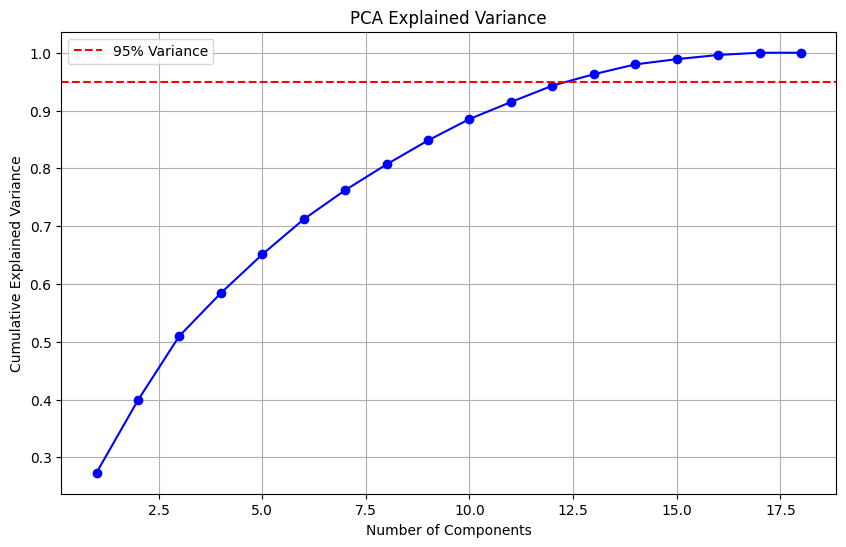

In [0]:
def apply_pca(data, variance_threshold=0.95):
    """
    Apply PCA to reduce dimensionality while preserving variance
    """
    pca = PCA()
    pca_data = pca.fit_transform(data)
    
    # Find number of components for desired variance
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= variance_threshold) + 1
    
    # Apply PCA with selected components
    pca_final = PCA(n_components=n_components)
    pca_transformed = pca_final.fit_transform(data)
    
    print(f"Original dimensions: {data.shape[1]}")
    print(f"PCA dimensions: {n_components}")
    print(f"Variance explained: {cumulative_variance[n_components-1]:.3f}")
    
    return pca_transformed, pca_final, cumulative_variance

# Apply PCA
pca_data, pca_model, cumulative_var = apply_pca(scaled_data)

# Visualize explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_var) + 1), cumulative_var, 'bo-')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.legend()
plt.grid(True)
plt.show()

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fb9fe439e40>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Ex

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fb9fe46a980>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Ex

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fb9fe4da020>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Ex

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fba2cc4c220>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Ex

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fba34f423e0>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Ex

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fba34f41f80>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Ex

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fba34f43a60>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Ex

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fb9fe4db920>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Ex

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fba2cc4cea0>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Ex

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

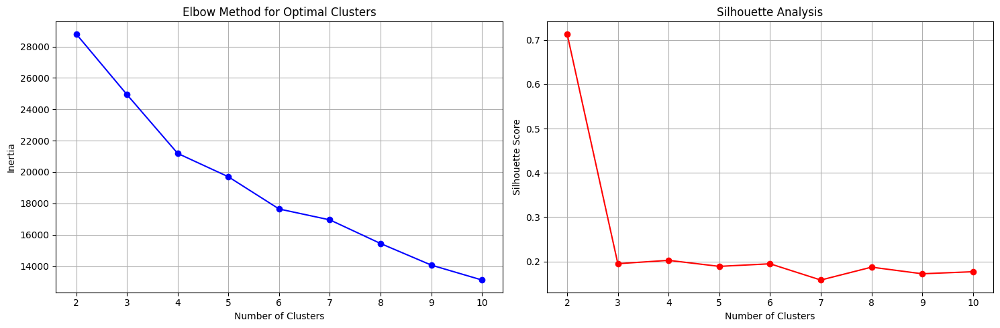

Clusters: 2, Silhouette Score: 0.713
Clusters: 3, Silhouette Score: 0.195
Clusters: 4, Silhouette Score: 0.203
Clusters: 5, Silhouette Score: 0.189
Clusters: 6, Silhouette Score: 0.195
Clusters: 7, Silhouette Score: 0.158
Clusters: 8, Silhouette Score: 0.187
Clusters: 9, Silhouette Score: 0.172
Clusters: 10, Silhouette Score: 0.177


In [0]:
def find_optimal_clusters(data, max_clusters=10):
    """
    Find optimal number of clusters using elbow method and silhouette analysis
    """
    inertias = []
    silhouette_scores = []
    cluster_range = range(2, max_clusters + 1)
    
    for k in cluster_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        cluster_labels = kmeans.fit_predict(data)
        
        inertias.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(data, cluster_labels))
    
    return cluster_range, inertias, silhouette_scores

# Find optimal clusters
cluster_range, inertias, sil_scores = find_optimal_clusters(pca_data)

# Plot elbow curve and silhouette scores
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Elbow plot
ax1.plot(cluster_range, inertias, 'bo-')
ax1.set_xlabel('Number of Clusters')
ax1.set_ylabel('Inertia')
ax1.set_title('Elbow Method for Optimal Clusters')
ax1.grid(True)

# Silhouette plot
ax2.plot(cluster_range, sil_scores, 'ro-')
ax2.set_xlabel('Number of Clusters')
ax2.set_ylabel('Silhouette Score')
ax2.set_title('Silhouette Analysis')
ax2.grid(True)

plt.tight_layout()
plt.show()

# Print silhouette scores
for k, score in zip(cluster_range, sil_scores):
    print(f"Clusters: {k}, Silhouette Score: {score:.3f}")

In [0]:
# Choose optimal number of clusters (adjust based on your analysis)
optimal_clusters = 2  # Adjust based on elbow method and silhouette scores

# Apply K-means clustering
kmeans_final = KMeans(n_clusters=optimal_clusters, random_state=42, n_init=10)
cluster_labels = kmeans_final.fit_predict(pca_data)

# Add cluster labels to original data
credit_constrained_df['cluster'] = cluster_labels

print(f"Cluster distribution:")
print(credit_constrained_df['cluster'].value_counts().sort_index())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fba244aba60>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'
Ex

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Cluster distribution:
0    2035
1      52
Name: cluster, dtype: int64


## Step 7: Cluster Analysis and Interpretation

In [0]:
def analyze_clusters(df, cluster_col='cluster', features=None):
    """
    Analyze and compare cluster characteristics
    """
    if features is None:
        features = df.select_dtypes(include=[np.number]).columns.tolist()
        features.remove(cluster_col)
    
    cluster_summary = df.groupby(cluster_col)[features].agg(['mean', 'median', 'std'])
    
    return cluster_summary

# Analyze cluster characteristics
cluster_analysis = analyze_clusters(credit_constrained_df, features=available_features)
print(cluster_analysis)

               AGE                    ...    OCCAT1                 
              mean median        std  ...      mean median       std
cluster                               ...                           
0        46.304177   47.0  14.100788  ...  1.615725    1.0  0.959734
1        64.692308   67.0  10.245111  ...  2.250000    2.0  0.437237

[2 rows x 36 columns]


In [0]:
def create_cluster_comparison_chart(df, features_to_compare, cluster_col='cluster'):
    """
    Create side-by-side bar charts comparing cluster characteristics
    """
    # Calculate means for each cluster
    cluster_means = df.groupby(cluster_col)[features_to_compare].mean()
    
    # Create subplots
    n_features = len(features_to_compare)
    cols = __builtins__.min(3, n_features)
    rows = (n_features + cols - 1) // cols
    
    fig = make_subplots(
        rows=rows, cols=cols,
        subplot_titles=features_to_compare,
        vertical_spacing=0.12
    )
    
    colors = px.colors.qualitative.Set1[:len(cluster_means)]
    
    for i, feature in enumerate(features_to_compare):
        row = i // cols + 1
        col = i % cols + 1
        
        fig.add_trace(
            go.Bar(
                x=[f"Cluster {j}" for j in cluster_means.index],
                y=cluster_means[feature],
                name=f'{feature}',
                marker_color=colors[i % len(colors)],
                showlegend=False
            ),
            row=row, col=col
        )
    
    fig.update_layout(
        height=300 * rows,
        title_text="Cluster Characteristics Comparison",
        title_x=0.5
    )
    
    return fig

# Create comparison chart for key features
key_features = ['INCOME', 'DEBT', 'AGE', 'NETWORTH'] if all(f in available_features for f in ['INCOME', 'DEBT', 'AGE', 'NETWORTH']) else available_features[:4]
comparison_chart = create_cluster_comparison_chart(credit_constrained_df, key_features)
comparison_chart.show()

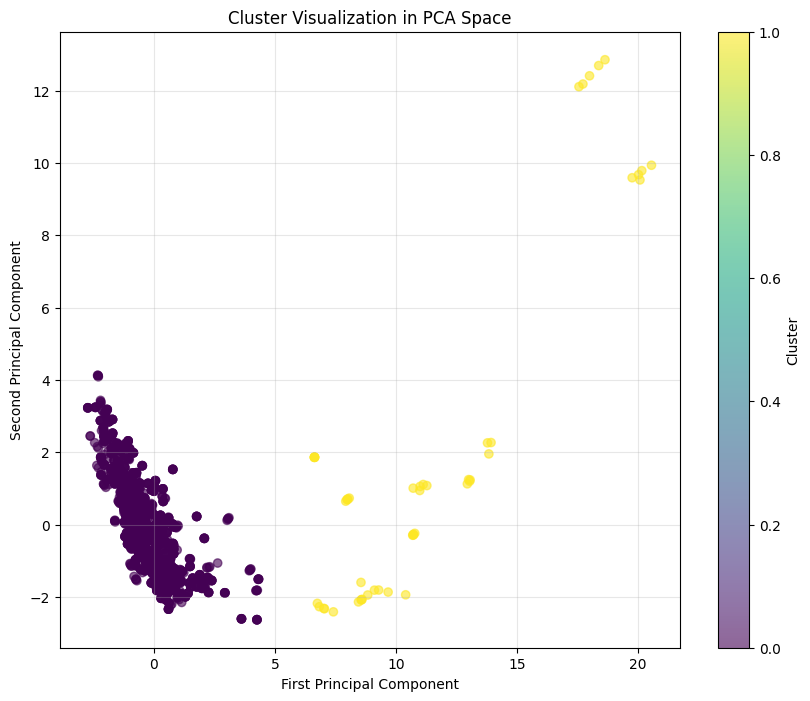

In [0]:
def visualize_clusters_pca(pca_data, labels, title="Cluster Visualization in PCA Space"):
    """
    Visualize clusters in 2D PCA space
    """
    if pca_data.shape[1] >= 2:
        plt.figure(figsize=(10, 8))
        scatter = plt.scatter(pca_data[:, 0], pca_data[:, 1], c=labels, cmap='viridis', alpha=0.6)
        plt.xlabel('First Principal Component')
        plt.ylabel('Second Principal Component')
        plt.title(title)
        plt.colorbar(scatter, label='Cluster')
        plt.grid(True, alpha=0.3)
        plt.show()
    
    # 3D visualization if we have at least 3 components
    if pca_data.shape[1] >= 3:
        fig = px.scatter_3d(
            x=pca_data[:, 0], y=pca_data[:, 1], z=pca_data[:, 2],
            color=labels,
            title="3D Cluster Visualization in PCA Space",
            labels={'x': 'PC1', 'y': 'PC2', 'z': 'PC3'}
        )
        fig.show()

# Visualize clusters
visualize_clusters_pca(pca_data, cluster_labels)

In [0]:
# Prepare summary statistics for the web app
def prepare_webapp_data(df, cluster_col='cluster'):
    """
    Prepare data summaries for the web application
    """
    # Overall statistics
    cluster_counts = df[cluster_col].value_counts().sort_index()
    
    # Feature summaries by cluster
    numerical_features = df.select_dtypes(include=[np.number]).columns.tolist()
    if cluster_col in numerical_features:
        numerical_features.remove(cluster_col)
    
    cluster_summaries = {}
    for cluster_id in sorted(df[cluster_col].unique()):
        cluster_data = df[df[cluster_col] == cluster_id]
        cluster_summaries[cluster_id] = {
            'count': len(cluster_data),
            'percentage': len(cluster_data) / len(df) * 100,
            'avg_income': cluster_data.get('INCOME', pd.Series([0])).mean(),
            'avg_debt': cluster_data.get('DEBT', pd.Series([0])).mean(),
            'avg_age': cluster_data.get('AGE', pd.Series([0])).mean(),
            'description': f"Cluster {cluster_id} characteristics"
        }
    
    return cluster_counts, cluster_summaries

cluster_counts, cluster_summaries = prepare_webapp_data(credit_constrained_df)

In [0]:
def generate_cluster_profiles(df, cluster_col='cluster'):
    """
    Generate detailed profiles for each cluster
    """
    profiles = {}
    
    for cluster_id in sorted(df[cluster_col].unique()):
        cluster_data = df[df[cluster_col] == cluster_id]
        
        profile = {
            'size': len(cluster_data),
            'percentage': len(cluster_data) / len(df) * 100,
        }
        
        # Add feature summaries
        numerical_cols = cluster_data.select_dtypes(include=[np.number]).columns
        for col in numerical_cols:
            if col != cluster_col:
                profile[f'avg_{col}'] = cluster_data[col].mean()
                profile[f'median_{col}'] = cluster_data[col].median()
        
        profiles[cluster_id] = profile
    
    return profiles

# Generate profiles
cluster_profiles = generate_cluster_profiles(credit_constrained_df)

# Print detailed profiles
for cluster_id, profile in cluster_profiles.items():
    print(f"\n=== CLUSTER {cluster_id} PROFILE ===")
    print(f"Size: {profile['size']} households ({profile['percentage']:.1f}%)")
    
    # Print key characteristics
    key_metrics = ['INCOME', 'DEBT', 'AGE', 'NETWORTH']
    for metric in key_metrics:
        avg_key = f'avg_{metric}'
        if avg_key in profile:
            print(f"Average {metric}: {profile[avg_key]:,.2f}")


=== CLUSTER 0 PROFILE ===
Size: 2035 households (97.5%)
Average INCOME: 79,827.40
Average DEBT: 128,899.52
Average AGE: 46.30
Average NETWORTH: 548,008.69

=== CLUSTER 1 PROFILE ===
Size: 52 households (2.5%)
Average INCOME: 3,415,785.30
Average DEBT: 2,875,634.62
Average AGE: 64.69
Average NETWORTH: 97,609,010.62


In [0]:
def generate_cluster_profiles(df, cluster_col='cluster'):
    """
    Generate detailed profiles for each cluster
    """
    profiles = {}
    
    for cluster_id in sorted(df[cluster_col].unique()):
        cluster_data = df[df[cluster_col] == cluster_id]
        
        profile = {
            'size': len(cluster_data),
            'percentage': len(cluster_data) / len(df) * 100,
        }
        
        # Add feature summaries
        numerical_cols = cluster_data.select_dtypes(include=[np.number]).columns
        for col in numerical_cols:
            if col != cluster_col:
                profile[f'avg_{col}'] = cluster_data[col].mean()
                profile[f'median_{col}'] = cluster_data[col].median()
        
        profiles[cluster_id] = profile
    
    return profiles

# Generate profiles
cluster_profiles = generate_cluster_profiles(credit_constrained_df)

# Print detailed profiles
for cluster_id, profile in cluster_profiles.items():
    print(f"\n=== CLUSTER {cluster_id} PROFILE ===")
    print(f"Size: {profile['size']} households ({profile['percentage']:.1f}%)")
    
    # Print key characteristics
    key_metrics = ['INCOME', 'DEBT', 'AGE', 'NETWORTH']
    for metric in key_metrics:
        avg_key = f'avg_{metric}'
        if avg_key in profile:
            print(f"Average {metric}: {profile[avg_key]:,.2f}")


=== CLUSTER 0 PROFILE ===
Size: 2035 households (97.5%)
Average INCOME: 79,827.40
Average DEBT: 128,899.52
Average AGE: 46.30
Average NETWORTH: 548,008.69

=== CLUSTER 1 PROFILE ===
Size: 52 households (2.5%)
Average INCOME: 3,415,785.30
Average DEBT: 2,875,634.62
Average AGE: 64.69
Average NETWORTH: 97,609,010.62


In [0]:
# Calculate and display model performance metrics
silhouette_avg = silhouette_score(pca_data, cluster_labels)
print(f"\nMODEL PERFORMANCE:")
print(f"Silhouette Score: {silhouette_avg:.3f}")
print(f"Number of Clusters: {optimal_clusters}")
print(f"Total Samples: {len(credit_constrained_df)}")
print(f"Features Used: {len(selected_features)}")
print(f"PCA Components: {pca_data.shape[1]}")
print(f"Variance Explained by PCA: {cumulative_var[pca_data.shape[1]-1]:.3f}")


MODEL PERFORMANCE:
Silhouette Score: 0.713
Number of Clusters: 2
Total Samples: 2087
Features Used: 18
PCA Components: 13
Variance Explained by PCA: 0.963


In [0]:
# Save key visualizations and results
import os

# Create output directory
output_dir = "/dbfs/FileStore/consumer_finance_clustering_output/"
os.makedirs(output_dir, exist_ok=True)

# Save cluster assignments
credit_constrained_df.to_csv(f"{output_dir}/clustered_data.csv", index=False)

# Save model objects 
import joblib
joblib.dump(kmeans_final, f"{output_dir}/kmeans_model.pkl")
joblib.dump(pca_model, f"{output_dir}/pca_model.pkl")
joblib.dump(scaler, f"{output_dir}/scaler.pkl")

# Save cluster profiles
import json
with open(f"{output_dir}/cluster_profiles.json", 'w') as f:
    json.dump({str(k): v for k, v in cluster_profiles.items()}, f, indent=2)

print("Results exported successfully!")

Results exported successfully!
